In [1]:
import io
import os
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (eg.pd.read_csv) 
import matplotlib.pyplot as plt
import seaborn as sns
%cd "D:\Imarticus\Machine Learning\lms\projects\Hierarchical Clustering\Dataset"

D:\Imarticus\Machine Learning\lms\projects\Hierarchical Clustering\Dataset


In [2]:
google=pd.read_csv('google_review_ratings.csv')
google.head()

,User,Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,...,Category 16,Category 17,Category 18,Category 19,Category 20,Category 21,Category 22,Category 23,Category 24,Unnamed: 25
0,User 1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
1,User 2,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
2,User 3,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
3,User 4,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
4,User 5,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN


In [3]:
google.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5456 entries, 0 to 5455
Data columns (total 26 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   User         5456 non-null   object 
 1   Category 1   5456 non-null   float64
 2   Category 2   5456 non-null   float64
 3   Category 3   5456 non-null   float64
 4   Category 4   5456 non-null   float64
 5   Category 5   5456 non-null   float64
 6   Category 6   5456 non-null   float64
 7   Category 7   5456 non-null   float64
 8   Category 8   5456 non-null   float64
 9   Category 9   5456 non-null   float64
 10  Category 10  5456 non-null   float64
 11  Category 11  5456 non-null   object 
 12  Category 12  5455 non-null   float64
 13  Category 13  5456 non-null   float64
 14  Category 14  5456 non-null   float64
 15  Category 15  5456 non-null   float64
 16  Category 16  5456 non-null   float64
 17  Category 17  5456 non-null   float64
 18  Category 18  5456 non-null   float64
 19  Catego

In [4]:
google['Unnamed: 25'].value_counts(dropna=False)

Unnamed: 25
NaN     5454
1.04       1
2.58       1
Name: count, dtype: int64

In [5]:
google['Category 11'].value_counts()

Category 11
5        1046
1.56       80
1.58       75
1.76       67
1.75       66
         ... 
3.84        1
2\t2.       1
3.82        1
3.18        1
3.54        1
Name: count, Length: 296, dtype: int64

In [6]:
old_column_names=['User', 'Category 1', 'Category 2', 'Category 3', 'Category 4',
       'Category 5', 'Category 6', 'Category 7', 'Category 8', 'Category 9',
       'Category 10', 'Category 11', 'Category 12', 'Category 13',
       'Category 14', 'Category 15', 'Category 16', 'Category 17',
       'Category 18', 'Category 19', 'Category 20', 'Category 21',
       'Category 22', 'Category 23', 'Category 24', 'Unnamed: 25']
new_column_names=['user_id','churches','resorts','beaches','parks','theaters','museums','malls','zoo','restaurants',
                  'pubs/bars','local services','burger/pizza shops','hotels/other lodgings','juice bars','art galleries',
                  'dance clubs','swimming pools','gyms','bakeries','beaty&spas','cafes','viewpoints','monuments','gardens']

In [7]:
google.rename(columns=dict(zip(old_column_names,new_column_names)), inplace=True)
google.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5456 entries, 0 to 5455
Data columns (total 26 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   user_id                5456 non-null   object 
 1   churches               5456 non-null   float64
 2   resorts                5456 non-null   float64
 3   beaches                5456 non-null   float64
 4   parks                  5456 non-null   float64
 5   theaters               5456 non-null   float64
 6   museums                5456 non-null   float64
 7   malls                  5456 non-null   float64
 8   zoo                    5456 non-null   float64
 9   restaurants            5456 non-null   float64
 10  pubs/bars              5456 non-null   float64
 11  local services         5456 non-null   object 
 12  burger/pizza shops     5455 non-null   float64
 13  hotels/other lodgings  5456 non-null   float64
 14  juice bars             5456 non-null   float64
 15  art 

In [8]:
google.columns

Index(['user_id', 'churches', 'resorts', 'beaches', 'parks', 'theaters',
       'museums', 'malls', 'zoo', 'restaurants', 'pubs/bars', 'local services',
       'burger/pizza shops', 'hotels/other lodgings', 'juice bars',
       'art galleries', 'dance clubs', 'swimming pools', 'gyms', 'bakeries',
       'beaty&spas', 'cafes', 'viewpoints', 'monuments', 'gardens',
       'Unnamed: 25'],
      dtype='object')

In [9]:
google=google.drop('Unnamed: 25',axis=1)

In [10]:
google.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5456 entries, 0 to 5455
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   user_id                5456 non-null   object 
 1   churches               5456 non-null   float64
 2   resorts                5456 non-null   float64
 3   beaches                5456 non-null   float64
 4   parks                  5456 non-null   float64
 5   theaters               5456 non-null   float64
 6   museums                5456 non-null   float64
 7   malls                  5456 non-null   float64
 8   zoo                    5456 non-null   float64
 9   restaurants            5456 non-null   float64
 10  pubs/bars              5456 non-null   float64
 11  local services         5456 non-null   object 
 12  burger/pizza shops     5455 non-null   float64
 13  hotels/other lodgings  5456 non-null   float64
 14  juice bars             5456 non-null   float64
 15  art 

In [11]:
google.isnull().sum()

user_id                  0
churches                 0
resorts                  0
beaches                  0
parks                    0
theaters                 0
museums                  0
malls                    0
zoo                      0
restaurants              0
pubs/bars                0
local services           0
burger/pizza shops       1
hotels/other lodgings    0
juice bars               0
art galleries            0
dance clubs              0
swimming pools           0
gyms                     0
bakeries                 0
beaty&spas               0
cafes                    0
viewpoints               0
monuments                0
gardens                  1
dtype: int64

In [12]:
google['burger/pizza shops'].value_counts()

burger/pizza shops
5.00    592
0.83    116
1.56     92
1.73     89
0.82     80
       ... 
4.73      1
4.71      1
4.70      1
4.00      1
3.55      1
Name: count, Length: 285, dtype: int64

In [13]:
google.gardens.value_counts()

gardens
5.00    368
0.00    225
1.36    100
1.38     69
1.30     68
       ... 
3.74      1
3.75      1
4.82      1
3.13      1
4.75      1
Name: count, Length: 296, dtype: int64

In [14]:
google['burger/pizza shops']=google['burger/pizza shops'].fillna(5.00)
google.gardens=google.gardens.fillna(5.00)

In [15]:
google.isnull().sum()

user_id                  0
churches                 0
resorts                  0
beaches                  0
parks                    0
theaters                 0
museums                  0
malls                    0
zoo                      0
restaurants              0
pubs/bars                0
local services           0
burger/pizza shops       0
hotels/other lodgings    0
juice bars               0
art galleries            0
dance clubs              0
swimming pools           0
gyms                     0
bakeries                 0
beaty&spas               0
cafes                    0
viewpoints               0
monuments                0
gardens                  0
dtype: int64

In [16]:
google.describe()

,churches,resorts,beaches,parks,theaters,museums,malls,zoo,restaurants,pubs/bars,...,art galleries,dance clubs,swimming pools,gyms,bakeries,beaty&spas,cafes,viewpoints,monuments,gardens
count,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.00000,5456.000000,5456.000000,5456.000000,5456.000000,...,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000
mean,1.455720,2.319707,2.489331,2.796886,2.958941,2.89349,3.351395,2.540795,3.126019,2.832729,...,2.206573,1.192801,0.949203,0.822414,0.969811,1.000071,0.965838,1.750537,1.531453,1.561386
std,0.827604,1.421438,1.247815,1.309159,1.339056,1.28240,1.413492,1.111391,1.356802,1.307665,...,1.715961,1.107005,0.973536,0.947911,1.203972,1.193891,0.929853,1.598734,1.316889,1.172574
min,0.000000,0.000000,0.000000,0.830000,1.120000,1.11000,1.120000,0.860000,0.840000,0.810000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.920000,1.360000,1.540000,1.730000,1.770000,1.79000,1.930000,1.620000,1.800000,1.640000,...,0.860000,0.690000,0.580000,0.530000,0.520000,0.540000,0.570000,0.740000,0.790000,0.880000
50%,1.340000,1.905000,2.060000,2.460000,2.670000,2.68000,3.230000,2.170000,2.800000,2.680000,...,1.330000,0.800000,0.740000,0.690000,0.690000,0.690000,0.760000,1.030000,1.070000,1.290000
75%,1.810000,2.682500,2.740000,4.092500,4.312500,3.84000,5.000000,3.190000,5.000000,3.530000,...,4.440000,1.160000,0.910000,0.840000,0.860000,0.860000,1.000000,2.070000,1.560000,1.660000
max,5.000000,5.000000,5.000000,5.000000,5.000000,5.00000,5.000000,5.000000,5.000000,5.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


In [17]:
google.describe(include='object')

,user_id,local services
count,5456,5456
unique,5456,296
top,User 1,5
freq,1,1046


In [18]:
google["local services"]=pd.to_numeric(google["local services"],errors="coerce").fillna(5.00)

In [19]:
google.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5456 entries, 0 to 5455
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   user_id                5456 non-null   object 
 1   churches               5456 non-null   float64
 2   resorts                5456 non-null   float64
 3   beaches                5456 non-null   float64
 4   parks                  5456 non-null   float64
 5   theaters               5456 non-null   float64
 6   museums                5456 non-null   float64
 7   malls                  5456 non-null   float64
 8   zoo                    5456 non-null   float64
 9   restaurants            5456 non-null   float64
 10  pubs/bars              5456 non-null   float64
 11  local services         5456 non-null   float64
 12  burger/pizza shops     5456 non-null   float64
 13  hotels/other lodgings  5456 non-null   float64
 14  juice bars             5456 non-null   float64
 15  art 

C:\Users\Eswar Aditya\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


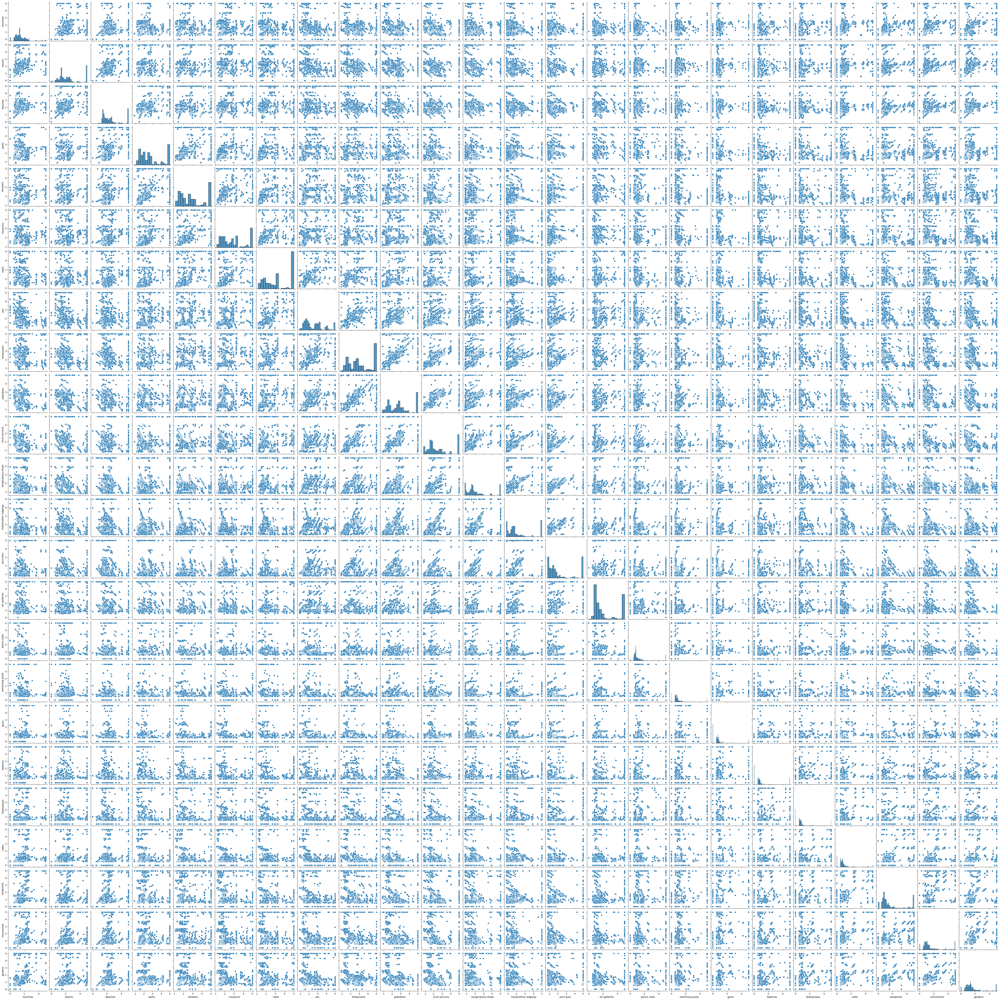

In [20]:
sns.pairplot(google)

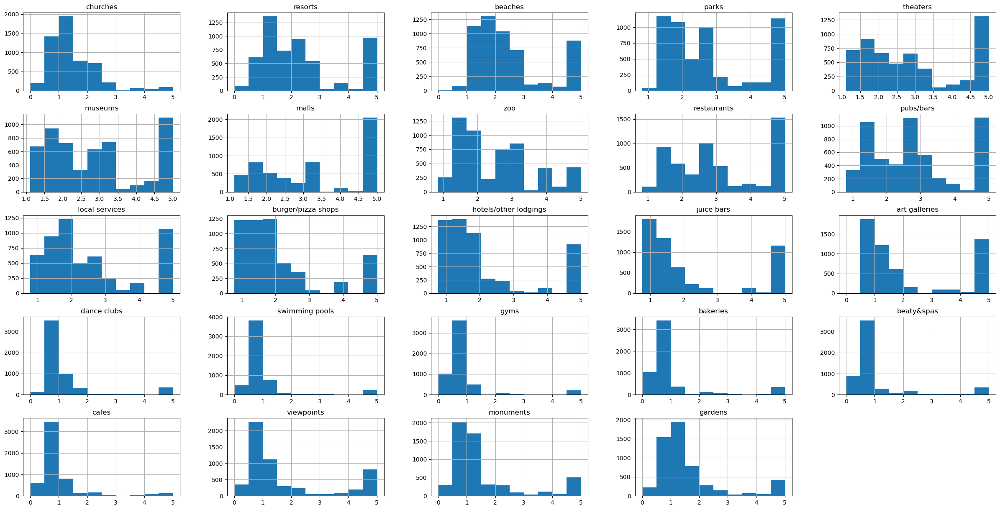

In [21]:
fig=google.hist(figsize=(30,15))

In [22]:
google=google.drop('user_id',axis=1)

In [23]:
from sklearn.cluster import AgglomerativeClustering

In [24]:
h_clust=AgglomerativeClustering(n_clusters=6,metric='euclidean',linkage='ward')

In [25]:
h_clust_model=h_clust.fit(google)

In [26]:
pd.DataFrame(h_clust_model.labels_).value_counts()

1    1298
0    1094
2    1091
4     993
5     494
3     486
Name: count, dtype: int64

In [27]:
import scipy.cluster.hierarchy as sch
from sklearn.metrics.pairwise import euclidean_distances

In [28]:
X_euclidean=euclidean_distances(google)

C:\Users\Eswar Aditya\AppData\Local\Temp\ipykernel_3352\2865490578.py:2: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  dendogram=sch.dendrogram(sch.linkage(X_euclidean,method="ward"))


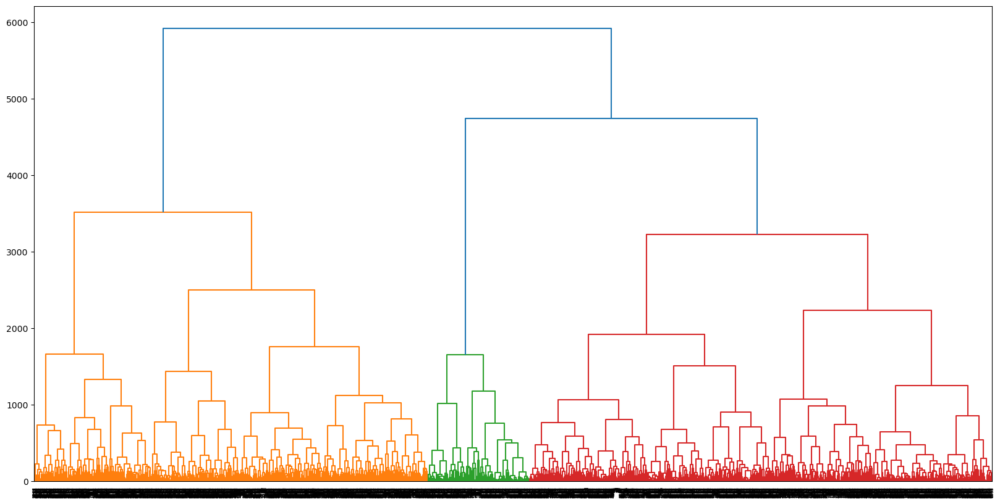

In [29]:
plt.figure(figsize=(20,10))
dendogram=sch.dendrogram(sch.linkage(X_euclidean,method="ward"))